In [1]:
import os
import pandas as pd

# Define folder paths
normal_folder = "normal"
tb_folder = "Tuberculosis_1"

# Create an empty DataFrame
df = pd.DataFrame(columns=["filename", "label"])

# Read images from "normal" folder and add to DataFrame
normal_data = []
for filename in os.listdir(normal_folder):
  filepath = os.path.join(normal_folder, filename)
  normal_data.append({"filename": filepath, "label": "normal"})
# Read images from "tuberculosis" folder and add to DataFrame
tb_data = []
for filename in os.listdir(tb_folder):
  filepath = os.path.join(tb_folder, filename)
  tb_data.append({"filename": filepath, "label": "tuberculosis"})

# Concatenate data from both folders into the DataFrame
df = pd.concat([pd.DataFrame(normal_data), pd.DataFrame(tb_data)], ignore_index=True)

# Print the DataFrame (optional)
print(df)

                                filename         label
0                    normal\Normal-1.png        normal
1                   normal\Normal-10.png        normal
2                  normal\Normal-100.png        normal
3                 normal\Normal-1000.png        normal
4                 normal\Normal-1001.png        normal
...                                  ...           ...
4195  Tuberculosis_1\Tuberculosis-95.png  tuberculosis
4196  Tuberculosis_1\Tuberculosis-96.png  tuberculosis
4197  Tuberculosis_1\Tuberculosis-97.png  tuberculosis
4198  Tuberculosis_1\Tuberculosis-98.png  tuberculosis
4199  Tuberculosis_1\Tuberculosis-99.png  tuberculosis

[4200 rows x 2 columns]


In [2]:
class_counts = df['label'].value_counts()

normal_count = class_counts['normal']
tb_count = class_counts['tuberculosis']

print(f"Number of normal images: {normal_count}")
print(f"Number of tuberculosis images: {tb_count}")

Number of normal images: 3500
Number of tuberculosis images: 700


In [3]:
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt
import uuid

# Function to apply CLAHE filter to an image and save it to a file
def apply_clahe_and_save(image, folder):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply CLAHE with adjusted parameters
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(16,16))  # Adjust parameters here
    clahe_img = clahe.apply(gray)
    # Generate unique filename
    filename = str(uuid.uuid4()) + ".png"
    filepath = os.path.join(folder, filename)
    # Save CLAHE filtered image to file
    cv2.imwrite(filepath, clahe_img)
    return filename


In [4]:
# Define folder paths
normal_folder = "normal"
tb_folder = "Tuberculosis_org"
enhanced_folder = "enhanced_img"

# Create the enhanced folder if it doesn't exist
if not os.path.exists(enhanced_folder):
    os.makedirs(enhanced_folder)

# Create an empty DataFrame
df = pd.DataFrame(columns=["filename", "label", "Enhanced_filename", "Enhanced_label"])

# Read images from "normal" folder and add to DataFrame with CLAHE applied
for filename in os.listdir(normal_folder):
    filepath = os.path.join(normal_folder, filename)
    image = cv2.imread(filepath)
    clahe_filename = apply_clahe_and_save(image, enhanced_folder)
    df = pd.concat([df, pd.DataFrame({"filename": filepath, "label": "normal", "Enhanced_filename": clahe_filename, "Enhanced_label": "normal"}, index=[0])], ignore_index=True)

# Read images from "tuberculosis" folder and add to DataFrame with CLAHE applied
for filename in os.listdir(tb_folder):
    filepath = os.path.join(tb_folder, filename)
    image = cv2.imread(filepath)
    clahe_filename = apply_clahe_and_save(image, enhanced_folder)
    df = pd.concat([df, pd.DataFrame({"filename": filepath, "label": "tuberculosis", "Enhanced_filename": clahe_filename, "Enhanced_label": "tuberculosis"}, index=[0])], ignore_index=True)

# Display DataFrame
print(df)

                                  filename         label  \
0                      normal\Normal-1.png        normal   
1                     normal\Normal-10.png        normal   
2                    normal\Normal-100.png        normal   
3                   normal\Normal-1000.png        normal   
4                   normal\Normal-1001.png        normal   
...                                    ...           ...   
6980  Tuberculosis_org\Tuberculosis-95.png  tuberculosis   
6981  Tuberculosis_org\Tuberculosis-96.png  tuberculosis   
6982  Tuberculosis_org\Tuberculosis-97.png  tuberculosis   
6983  Tuberculosis_org\Tuberculosis-98.png  tuberculosis   
6984  Tuberculosis_org\Tuberculosis-99.png  tuberculosis   

                             Enhanced_filename Enhanced_label  
0     9c342097-22d9-4da6-aae4-edbe83a74925.png         normal  
1     249d04ec-98a2-409b-b467-10b30bd23cf0.png         normal  
2     baf3be36-6b0f-437f-9977-9f8afd5c102d.png         normal  
3     5b51258f-fc21-499

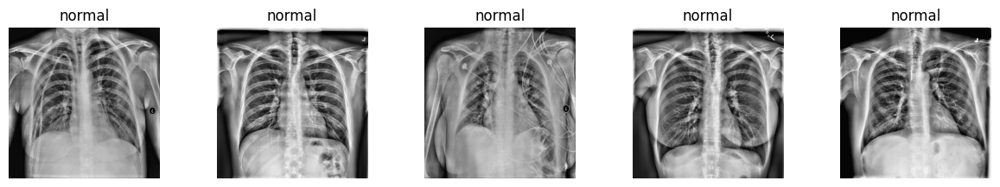

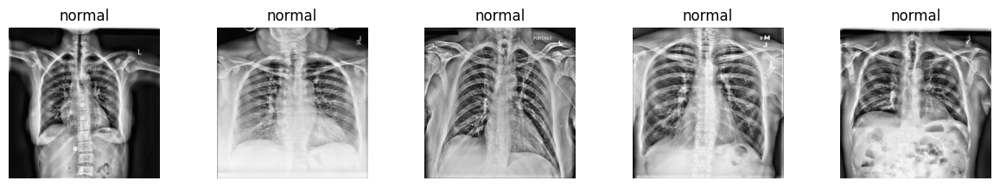

<Figure size 1500x500 with 0 Axes>

In [5]:
# Display enhanced images
plt.figure(figsize=(15, 5))
for i in range(10):
    # Read enhanced image
    enhanced_img = cv2.imread(os.path.join(enhanced_folder, df.at[i, 'Enhanced_filename']), cv2.IMREAD_GRAYSCALE)
    plt.subplot(2, 5, i%5+1)
    plt.imshow(enhanced_img, cmap='gray')
    plt.title(df.at[i, 'Enhanced_label'])
    plt.axis('off')
    if i%5 == 4:
        plt.show()
        plt.figure(figsize=(15, 5))
plt.show()

In [6]:
# Shuffle the rows of the DataFrame
df = df.sample(frac=1).reset_index(drop=True)
# Display DataFrame
print(df)


                                               filename         label  \
0     Tuberculosis_org\augmented_1_Tuberculosis-456.png  tuberculosis   
1                                 normal\Normal-864.png        normal   
2                                normal\Normal-1010.png        normal   
3                                normal\Normal-2928.png        normal   
4     Tuberculosis_org\augmented_3_Tuberculosis-652.png  tuberculosis   
...                                                 ...           ...   
6980              Tuberculosis_org\Tuberculosis-355.png  tuberculosis   
6981                             normal\Normal-2659.png        normal   
6982  Tuberculosis_org\augmented_1_Tuberculosis-165.png  tuberculosis   
6983                             normal\Normal-2631.png        normal   
6984   Tuberculosis_org\augmented_0_Tuberculosis-75.png  tuberculosis   

                             Enhanced_filename Enhanced_label  
0     0688030f-107b-4e88-9833-b160f540f48d.png   tuberculos

In [7]:
class_counts = df['label'].value_counts()

normal_count = class_counts['normal']
tb_count = class_counts['tuberculosis']

print(f"Number of normal images: {normal_count}")
print(f"Number of tuberculosis images: {tb_count}")

Number of normal images: 3500
Number of tuberculosis images: 3485


In [8]:
# Save the DataFrame to a CSV file
csv_filename = "Tb_enhanced.csv"
df.to_csv(csv_filename, index=False)

# Display DataFrame
print(df)

                                               filename         label  \
0     Tuberculosis_org\augmented_1_Tuberculosis-456.png  tuberculosis   
1                                 normal\Normal-864.png        normal   
2                                normal\Normal-1010.png        normal   
3                                normal\Normal-2928.png        normal   
4     Tuberculosis_org\augmented_3_Tuberculosis-652.png  tuberculosis   
...                                                 ...           ...   
6980              Tuberculosis_org\Tuberculosis-355.png  tuberculosis   
6981                             normal\Normal-2659.png        normal   
6982  Tuberculosis_org\augmented_1_Tuberculosis-165.png  tuberculosis   
6983                             normal\Normal-2631.png        normal   
6984   Tuberculosis_org\augmented_0_Tuberculosis-75.png  tuberculosis   

                             Enhanced_filename Enhanced_label  
0     0688030f-107b-4e88-9833-b160f540f48d.png   tuberculos

Found 5588 validated image filenames belonging to 2 classes.
Found 1397 validated image filenames belonging to 2 classes.
Epoch 1/10


C:\Users\kaart\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


175/175 ━━━━━━━━━━━━━━━━━━━━ 782s 4s/step - accuracy: 0.9443 - loss: 0.1390 - val_accuracy: 0.5075 - val_loss: 4.2273
Epoch 2/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 554s 3s/step - accuracy: 0.9875 - loss: 0.0399 - val_accuracy: 0.4925 - val_loss: 0.7843
Epoch 3/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 559s 3s/step - accuracy: 0.9854 - loss: 0.0393 - val_accuracy: 0.5075 - val_loss: 0.9512
Epoch 4/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 555s 3s/step - accuracy: 0.9967 - loss: 0.0118 - val_accuracy: 0.9291 - val_loss: 0.1878
Epoch 5/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 550s 3s/step - accuracy: 0.9923 - loss: 0.0270 - val_accuracy: 0.9785 - val_loss: 0.0625
Epoch 6/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 549s 3s/step - accuracy: 0.9926 - loss: 0.0153 - val_accuracy: 0.9971 - val_loss: 0.0056
Epoch 7/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 549s 3s/step - accuracy: 0.9967 - loss: 0.0095 - val_accuracy: 0.8382 - val_loss: 0.8056
Epoch 8/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 549s 3s/step - accuracy: 0.9969 - loss: 0.0092 - val_accuracy: 0.963

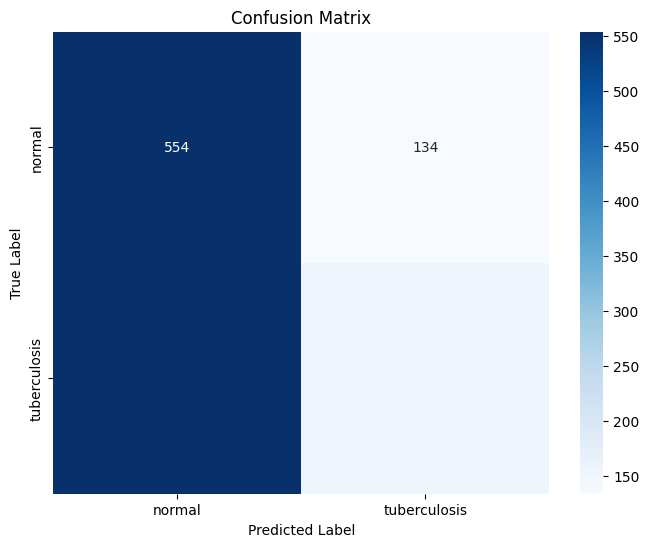

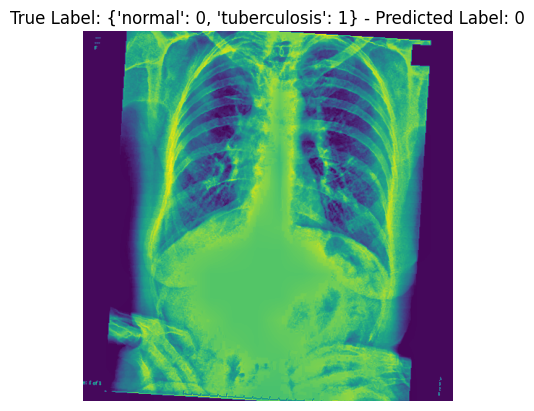

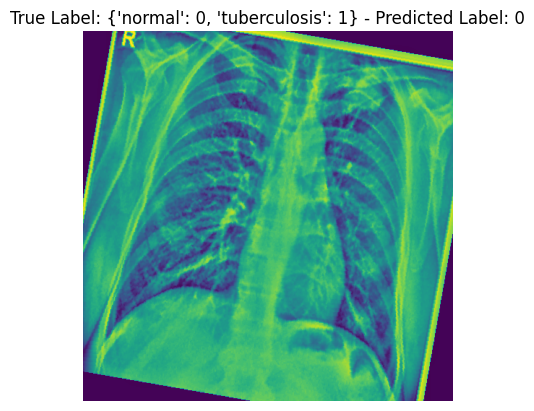

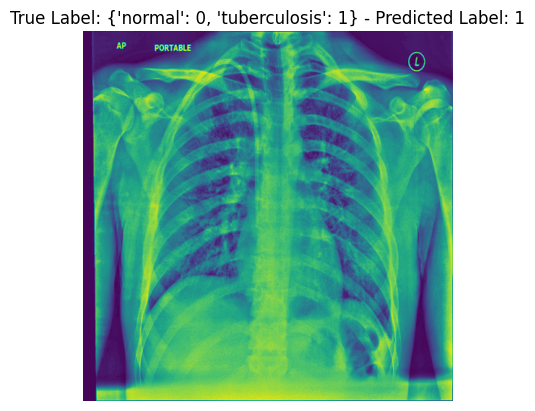

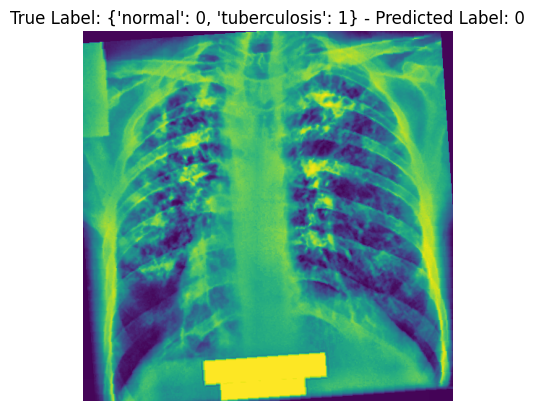

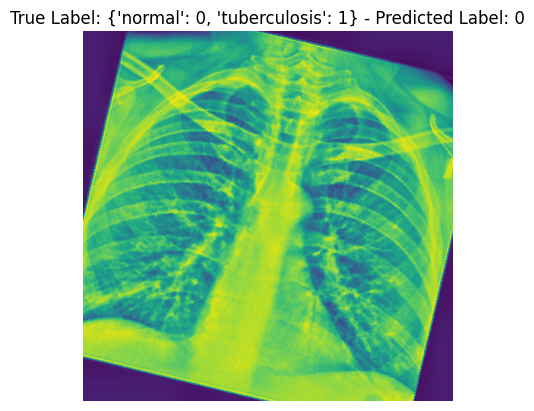

In [9]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
import os
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, roc_auc_score

# Load the CSV file into a DataFrame
csv_filename = "Tb_enhanced.csv"
loaded_df = pd.read_csv(csv_filename)

# EfficientNet model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)  # Dropout layer with 50% dropout rate
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])



# Define a function to get the full path
def get_full_path(row):
    return os.path.join(enhanced_folder, row['Enhanced_filename'])

# Add a full path column to the DataFrame
loaded_df['full_path'] = loaded_df.apply(get_full_path, axis=1)

# Data augmentation and preprocessing
datagen = ImageDataGenerator(
    rescale=1./255,  # rescale pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # specify the validation split
)

# Data generator for training set
train_generator = datagen.flow_from_dataframe(
    dataframe=loaded_df,
    x_col="full_path",
    y_col="Enhanced_label",  # Use 'Enhanced_label' instead of 'label'
    subset="training",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224, 224)
)

# Data generator for validation set
valid_generator = datagen.flow_from_dataframe(
    dataframe=loaded_df,
    x_col="full_path",
    y_col="Enhanced_label",  # Use 'Enhanced_label' instead of 'label'
    subset="validation",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224, 224)
)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=valid_generator
)
# Evaluation on validation set
val_loss, val_accuracy = model.evaluate(valid_generator)

print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

# Predict probabilities for validation set
y_pred_prob = model.predict(valid_generator)
y_pred = np.argmax(y_pred_prob, axis=1)

# Convert one-hot encoded labels to integers
y_true = valid_generator.classes

# Calculate additional metrics
print(classification_report(y_true, y_pred, target_names=valid_generator.class_indices))

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
cohen_kappa = cohen_kappa_score(y_true, y_pred)
auc_roc = roc_auc_score(y_true, y_pred_prob[:, 1])

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Cohen's Kappa:", cohen_kappa)
print("AUC-ROC:", auc_roc)

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=valid_generator.class_indices, yticklabels=valid_generator.class_indices)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Error Analysis - Show misclassified images
misclassified_indices = np.where(y_pred != y_true)[0]
for idx in misclassified_indices[:5]:  # Display the first 5 misclassified images
    img_path = valid_generator.filepaths[idx]
    true_label = valid_generator.classes[idx]
    predicted_label = y_pred[idx]
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"True Label: {valid_generator.class_indices} - Predicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()

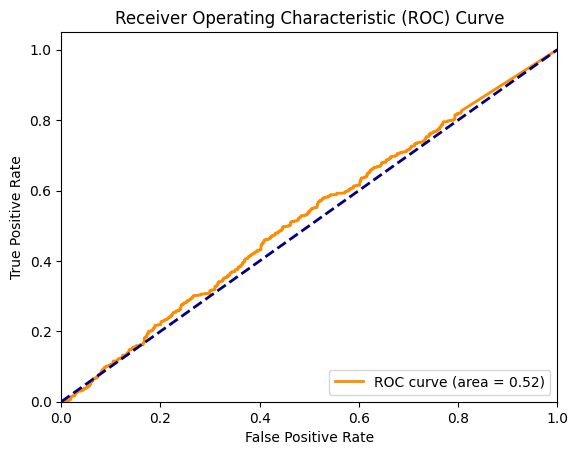

AUC-ROC: 0.5196384934562273


In [10]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_true, y_pred_prob[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

print("AUC-ROC:", roc_auc)


In [ ]:
# Evaluate the model
evaluation = model.evaluate(valid_generator)
print("Validation Loss:", evaluation[0])
print("Validation Accuracy:", evaluation[1])

# Visualize training history
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


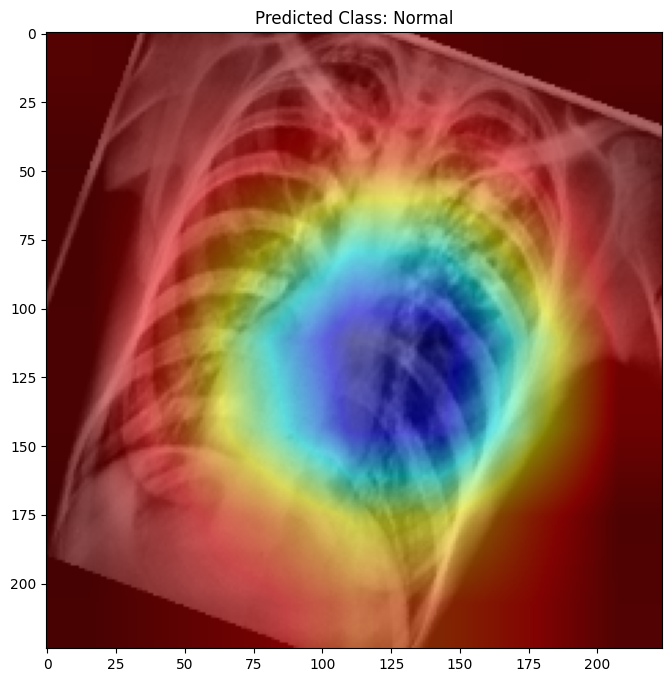

In [22]:
from tensorflow.keras.models import Model
import tensorflow as tf
import numpy as np
import cv2

def get_gradcam(model, img_array, layer_name):
    img_tensor = tf.convert_to_tensor(img_array)
    img_tensor = tf.expand_dims(img_tensor, axis=0)

    last_conv_layer = model.get_layer(layer_name)
    new_model = Model(model.inputs, [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = new_model(img_tensor)
        top_prediction = predictions[:, np.argmax(predictions[0])]
        grads = tape.gradient(top_prediction, conv_outputs)

    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    conv_outputs = conv_outputs[0]
    guided_grads = guided_grads[0]

    cam = tf.reduce_sum(tf.multiply(guided_grads, conv_outputs), axis=-1)
    cam -= tf.reduce_min(cam)
    cam /= tf.reduce_max(cam)

    return cam.numpy()

def apply_gradcam(model, img_path, layer_name):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img = img.astype(np.float32) / 255.0

    cam = get_gradcam(model, img, layer_name)
    heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = heatmap / 255.0
    superimposed_img = heatmap * 0.5 + img * 0.5
    superimposed_img = np.clip(superimposed_img, 0, 1)

    return superimposed_img, heatmap

from tensorflow.keras.models import Model
import tensorflow as tf
import numpy as np
import cv2

def get_gradcam(model, img_array, layer_name):
    img_tensor = tf.convert_to_tensor(img_array)
    img_tensor = tf.expand_dims(img_tensor, axis=0)

    last_conv_layer = model.get_layer(layer_name)
    new_model = Model(model.inputs, [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = new_model(img_tensor)
        top_prediction = predictions[:, np.argmax(predictions[0])]
        grads = tape.gradient(top_prediction, conv_outputs)

    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    conv_outputs = conv_outputs[0]
    guided_grads = guided_grads[0]

    cam = tf.reduce_sum(tf.multiply(guided_grads, conv_outputs), axis=-1)
    cam -= tf.reduce_min(cam)
    cam /= tf.reduce_max(cam)

    return cam.numpy()

def apply_gradcam(model, img_path, layer_name):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img = img.astype(np.float32) / 255.0

    cam = get_gradcam(model, img, layer_name)
    heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = heatmap / 255.0
    superimposed_img = heatmap * 0.5 + img * 0.5
    superimposed_img = np.clip(superimposed_img, 0, 1)

    return superimposed_img, heatmap

# Select an image and layer for visualization
image_index = 0  # Change this to the index of the image you want to visualize
layer_name = 'conv5_block3_out'  # Change this to the name of the last convolutional layer

# Visualize Grad-CAM for the selected image
fig, ax = plt.subplots(figsize=(8, 8))
superimposed_img, heatmap = apply_gradcam(model, loaded_df['full_path'][image_index], layer_name)

# Determine the class of the image (TB or normal) based on the model's prediction
image_path = loaded_df['full_path'][image_index]
img = cv2.imread(image_path)
img = cv2.resize(img, (224, 224))
img = img.astype(np.float32) / 255.0
img_tensor = tf.convert_to_tensor(img)
img_tensor = tf.expand_dims(img_tensor, axis=0)
prediction = model.predict(img_tensor)
predicted_class = "TB" if prediction[0][1] > prediction[0][0] else "Normal"

# Display the image with its Grad-CAM overlay
ax.imshow(superimposed_img)
ax.set_title(f"Predicted Class: {predicted_class}")
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step


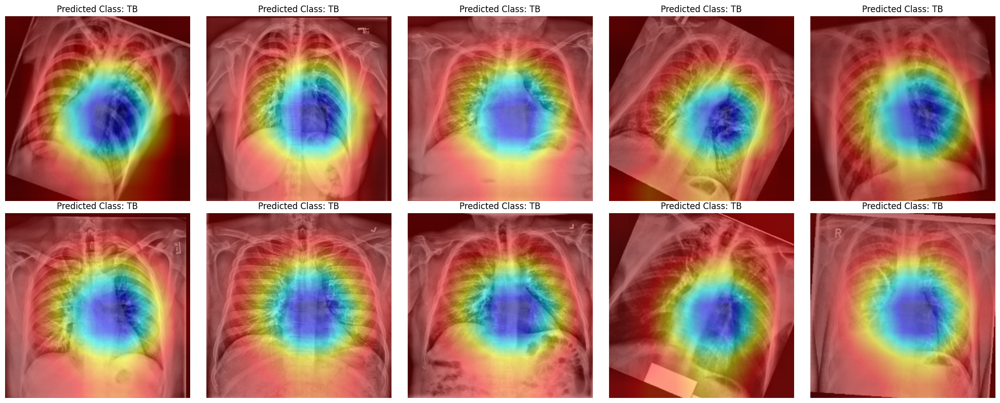

In [26]:
from tensorflow.keras.models import Model
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_gradcam(model, img_array, layer_name):
    img_tensor = tf.convert_to_tensor(img_array)
    img_tensor = tf.expand_dims(img_tensor, axis=0)

    last_conv_layer = model.get_layer(layer_name)
    new_model = Model(model.inputs, [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = new_model(img_tensor)
        top_prediction = predictions[:, np.argmax(predictions[0])]
        grads = tape.gradient(top_prediction, conv_outputs)

    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    conv_outputs = conv_outputs[0]
    guided_grads = guided_grads[0]

    cam = tf.reduce_sum(tf.multiply(guided_grads, conv_outputs), axis=-1)
    cam -= tf.reduce_min(cam)
    cam /= tf.reduce_max(cam)

    return cam.numpy()

def apply_gradcam(model, img_path, layer_name):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img = img.astype(np.float32) / 255.0

    cam = get_gradcam(model, img, layer_name)
    heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = heatmap / 255.0
    superimposed_img = heatmap * 0.5 + img * 0.5
    superimposed_img = np.clip(superimposed_img, 0, 1)

    return superimposed_img, heatmap

def get_predicted_class(model, img_array):
    img = cv2.resize(img_array, (224, 224))  # Resize the image to match the model's input shape
    img_tensor = tf.convert_to_tensor(img)
    img_tensor = tf.expand_dims(img_tensor, axis=0)
    prediction = model.predict(img_tensor)
    predicted_class = "TB" if prediction[0][1] > prediction[0][0] else "Normal"
    return predicted_class

def visualize_gradcam_for_images(model, image_paths, layer_name, num_images=10):
    num_rows = (num_images + 4) // 5
    fig, axes = plt.subplots(num_rows, 5, figsize=(20, num_rows * 4))

    for i, img_path in enumerate(image_paths[:num_images]):
        row = i // 5
        col = i % 5
        ax = axes[row, col] if num_rows > 1 else axes[col]

        superimposed_img, _ = apply_gradcam(model, img_path, layer_name)
        predicted_class = get_predicted_class(model, cv2.imread(img_path))
        ax.imshow(superimposed_img)
        ax.axis('off')
        ax.set_title(f'Predicted Class: {predicted_class}')

    plt.tight_layout()
    plt.show()

# Select the first 10 image paths from your dataset
image_paths = loaded_df['full_path'][:10]  # Change this according to your dataset size

# Visualize Grad-CAM for the selected images
visualize_gradcam_for_images(model, image_paths, 'conv5_block3_out')


Found 5588 validated image filenames belonging to 2 classes.
Found 1397 validated image filenames belonging to 2 classes.
Epoch 1/10


C:\Users\kaart\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


175/175 ━━━━━━━━━━━━━━━━━━━━ 269s 1s/step - accuracy: 0.5316 - loss: 0.8118 - val_accuracy: 0.6643 - val_loss: 0.6244
Epoch 2/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 258s 1s/step - accuracy: 0.6167 - loss: 0.6517 - val_accuracy: 0.7165 - val_loss: 0.5887
Epoch 3/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 261s 1s/step - accuracy: 0.6130 - loss: 0.6624 - val_accuracy: 0.6893 - val_loss: 0.5808
Epoch 4/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 258s 1s/step - accuracy: 0.6548 - loss: 0.6250 - val_accuracy: 0.6356 - val_loss: 0.5938
Epoch 5/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 258s 1s/step - accuracy: 0.6615 - loss: 0.6054 - val_accuracy: 0.7115 - val_loss: 0.5493
Epoch 6/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 257s 1s/step - accuracy: 0.6744 - loss: 0.6020 - val_accuracy: 0.7509 - val_loss: 0.5276
Epoch 7/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 260s 1s/step - accuracy: 0.6799 - loss: 0.5939 - val_accuracy: 0.7416 - val_loss: 0.5264
Epoch 8/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 259s 1s/step - accuracy: 0.7109 - loss: 0.5626 - val_accuracy: 0.680

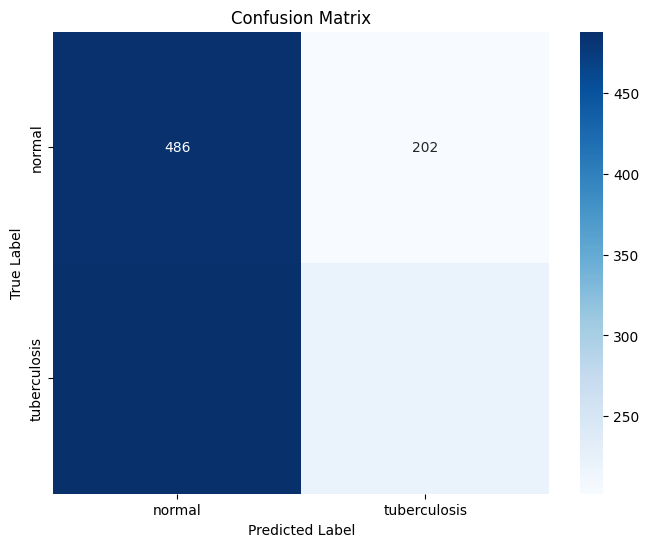

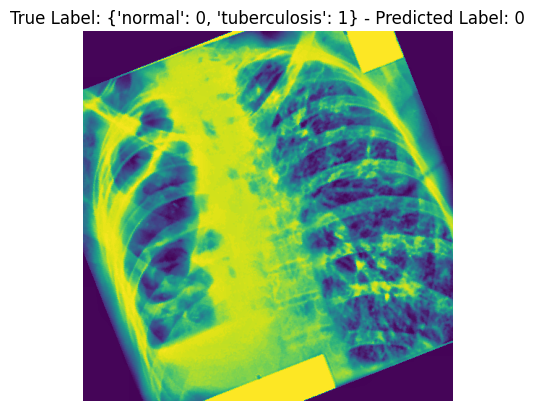

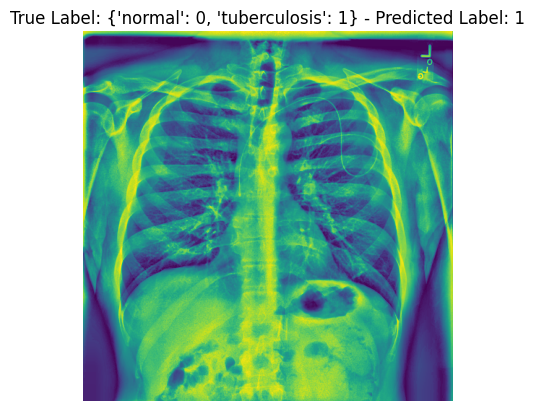

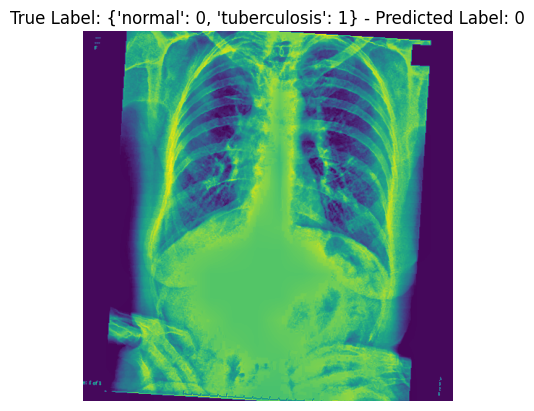

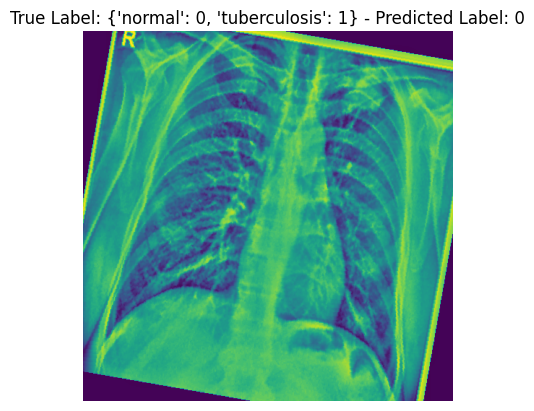

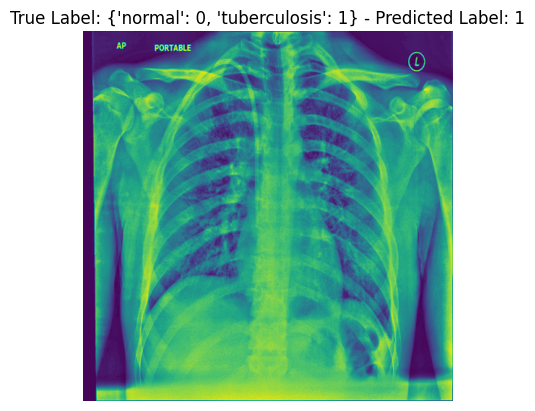

In [11]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score, roc_auc_score

# Load the CSV file into a DataFrame
csv_filename = "Tb_enhanced.csv"
loaded_df = pd.read_csv(csv_filename)

# ResNet model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers (optional for fine-tuning)
base_model.trainable = False  # Uncomment to freeze layers

# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)  # Dropout layer with 50% dropout rate
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Define a function to get the full path
def get_full_path(row):
    return os.path.join(enhanced_folder, row['Enhanced_filename'])

# Add a full path column to the DataFrame
loaded_df['full_path'] = loaded_df.apply(get_full_path, axis=1)

# Data augmentation and preprocessing
datagen = ImageDataGenerator(
    rescale=1./255,  # rescale pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2  # specify the validation split
)

# Data generator for training set
train_generator = datagen.flow_from_dataframe(
    dataframe=loaded_df,
    x_col="full_path",
    y_col="Enhanced_label",  # Use 'Enhanced_label' instead of 'label'
    subset="training",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224, 224)
)

# Data generator for validation set
valid_generator = datagen.flow_from_dataframe(
    dataframe=loaded_df,
    x_col="full_path",
    y_col="Enhanced_label",  # Use 'Enhanced_label' instead of 'label'
    subset="validation",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224, 224)
)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=valid_generator
)

# Evaluation on validation set
val_loss, val_accuracy = model.evaluate(valid_generator)

print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

# Predict probabilities for validation set
y_pred_prob = model.predict(valid_generator)
y_pred = np.argmax(y_pred_prob, axis=1)

# Convert one-hot encoded labels to integers
y_true = valid_generator.classes

# Calculate additional metrics
print(classification_report(y_true, y_pred, target_names=valid_generator.class_indices))

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)
cohen_kappa = cohen_kappa_score(y_true, y_pred)
auc_roc = roc_auc_score(y_true, y_pred_prob[:, 1])

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Cohen's Kappa:", cohen_kappa)
print("AUC-ROC:", auc_roc)

# Plot Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=valid_generator.class_indices, yticklabels=valid_generator.class_indices)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Error Analysis - Show misclassified images
misclassified_indices = np.where(y_pred != y_true)[0]
for idx in misclassified_indices[:5]:  # Display the first 5 misclassified images
    img_path = valid_generator.filepaths[idx]
    true_label = valid_generator.classes[idx]
    predicted_label = y_pred[idx]
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"True Label: {valid_generator.class_indices} - Predicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()


44/44 ━━━━━━━━━━━━━━━━━━━━ 51s 1s/step - accuracy: 0.7454 - loss: 0.5046
Validation Loss: 0.49647703766822815
Validation Accuracy: 0.7494631409645081


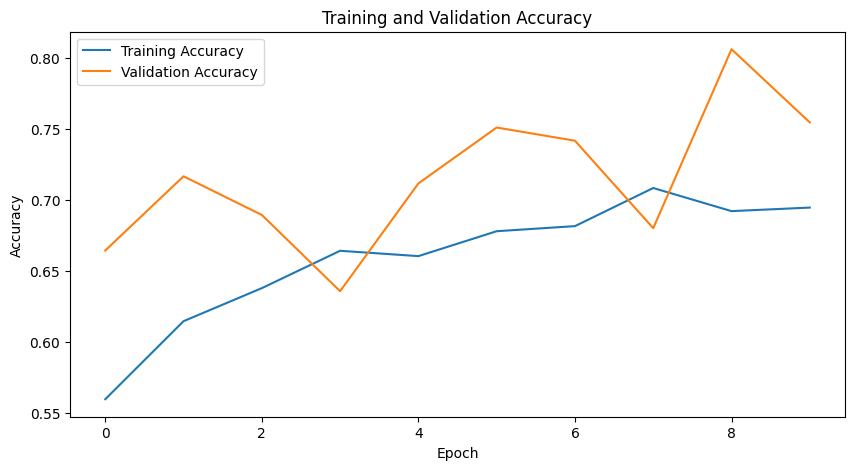

In [12]:
# Evaluate the model
loss, accuracy = model.evaluate(valid_generator)
print("Validation Loss:", loss)
print("Validation Accuracy:", accuracy)

# Visualize training history
epochs = range(len(history.history['accuracy']))  # Get number of epochs

plt.figure(figsize=(10, 5))  # Set figure size

# Plot accuracy
plt.plot(epochs, history.history['accuracy'], label='Training Accuracy')
plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss (on same plot as accuracy)
#plt.twinx()  # Create twin axes for loss
#plt.plot(epochs, history.history['loss'], label='Training Loss', color='red')
#plt.plot(epochs, history.history['val_loss'], label='Validation Loss', color='red')
#plt.ylabel('Loss')

plt.legend()  # Include loss legend entries
plt.show()


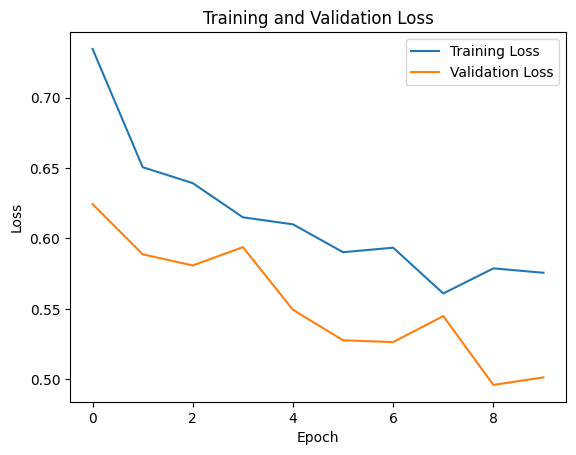

In [13]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

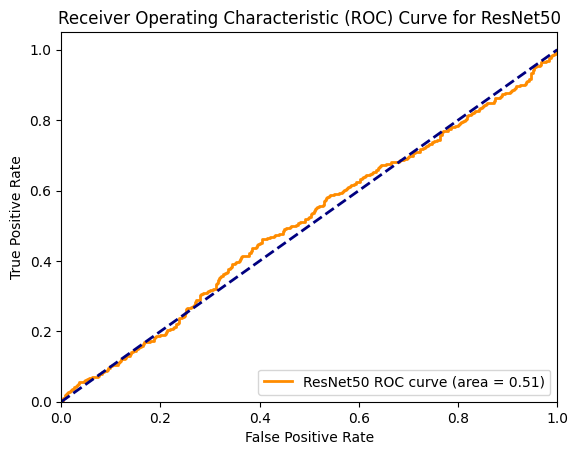

ResNet50 AUC-ROC: 0.5083539705448223


In [14]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr_resnet, tpr_resnet, _ = roc_curve(y_true, y_pred_prob[:, 1])  # Assuming tuberculosis is class 1
roc_auc_resnet = auc(fpr_resnet, tpr_resnet)

# Plot ROC curve for ResNet50
plt.figure()
plt.plot(fpr_resnet, tpr_resnet, color='darkorange', lw=2, label='ResNet50 ROC curve (area = %0.2f)' % roc_auc_resnet)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for ResNet50')
plt.legend(loc="lower right")
plt.show()

print("ResNet50 AUC-ROC:", roc_auc_resnet)


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step


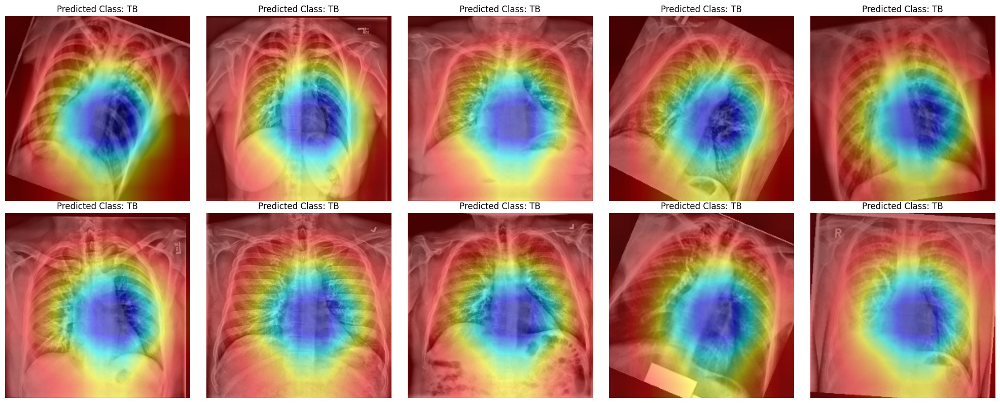

In [37]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

def get_gradcam(model, img_array, layer_name):
    img_tensor = tf.convert_to_tensor(img_array)
    img_tensor = tf.expand_dims(img_tensor, axis=0)

    last_conv_layer = model.get_layer(layer_name)
    new_model = tf.keras.models.Model(model.inputs, [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = new_model(img_tensor)
        top_prediction = predictions[:, np.argmax(predictions[0])]
        grads = tape.gradient(top_prediction, conv_outputs)

    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    conv_outputs = conv_outputs[0]
    guided_grads = guided_grads[0]

    cam = tf.reduce_sum(tf.multiply(guided_grads, conv_outputs), axis=-1)
    cam -= tf.reduce_min(cam)
    cam /= tf.reduce_max(cam)

    return cam.numpy()

def apply_gradcam(model, img_path, layer_name):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img = img.astype(np.float32) / 255.0

    cam = get_gradcam(model, img, layer_name)
    heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = heatmap / 255.0
    superimposed_img = heatmap * 0.5 + img * 0.5
    superimposed_img = np.clip(superimposed_img, 0, 1)

    return superimposed_img, heatmap

def get_predicted_class(model, img_array):
    img = cv2.resize(img_array, (224, 224))  # Resize the image to match the model's input shape
    img_tensor = tf.convert_to_tensor(img)
    img_tensor = tf.expand_dims(img_tensor, axis=0)
    prediction = model.predict(img_tensor)
    predicted_class = "TB" if prediction[0][1] > prediction[0][0] else "Normal"
    return predicted_class


def visualize_gradcam_for_images(model, image_paths, layer_name, num_images=10):
    num_rows = (num_images + 4) // 5
    fig, axes = plt.subplots(num_rows, 5, figsize=(20, num_rows * 4))

    for i, img_path in enumerate(image_paths[:num_images]):
        row = i // 5
        col = i % 5
        ax = axes[row, col] if num_rows > 1 else axes[col]

        superimposed_img, _ = apply_gradcam(model, img_path, layer_name)
        predicted_class = get_predicted_class(model, cv2.imread(img_path))
        ax.imshow(superimposed_img)
        ax.axis('off')
        ax.set_title(f'Predicted Class: {predicted_class}')

    plt.tight_layout()
    plt.show()

# Select the first 10 image paths from your dataset
image_paths = loaded_df['full_path'][:10]  # Change this according to your dataset size

# Visualize Grad-CAM for the selected images
visualize_gradcam_for_images(model, image_paths, 'conv5_block3_out')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step


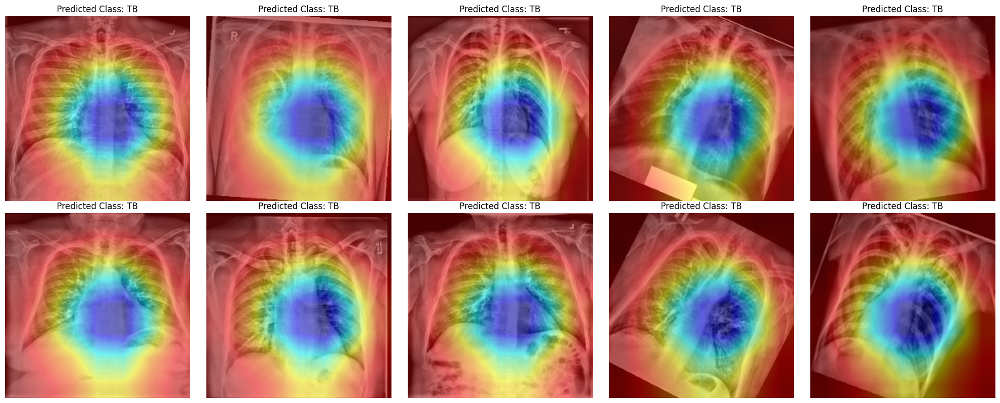

In [39]:
import random
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

def get_gradcam(model, img_array, layer_name):
    img_tensor = tf.convert_to_tensor(img_array)
    img_tensor = tf.expand_dims(img_tensor, axis=0)

    last_conv_layer = model.get_layer(layer_name)
    new_model = tf.keras.models.Model(model.inputs, [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = new_model(img_tensor)
        top_prediction = predictions[:, np.argmax(predictions[0])]
        grads = tape.gradient(top_prediction, conv_outputs)

    guided_grads = tf.cast(conv_outputs > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    conv_outputs = conv_outputs[0]
    guided_grads = guided_grads[0]

    cam = tf.reduce_sum(tf.multiply(guided_grads, conv_outputs), axis=-1)
    cam -= tf.reduce_min(cam)
    cam /= tf.reduce_max(cam)

    return cam.numpy()

def apply_gradcam(model, img_path, layer_name):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img = img.astype(np.float32) / 255.0

    cam = get_gradcam(model, img, layer_name)
    heatmap = cv2.resize(cam, (img.shape[1], img.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = heatmap / 255.0
    superimposed_img = heatmap * 0.5 + img * 0.5
    superimposed_img = np.clip(superimposed_img, 0, 1)

    return superimposed_img, heatmap

def get_predicted_class(model, img_array):
    img = cv2.resize(img_array, (224, 224))  # Resize the image to match the model's input shape
    img_tensor = tf.convert_to_tensor(img)
    img_tensor = tf.expand_dims(img_tensor, axis=0)
    prediction = model.predict(img_tensor)
    predicted_class = "TB" if prediction[0][1] > prediction[0][0] else "Normal"
    return predicted_class


def visualize_gradcam_for_images(model, image_paths, layer_name, num_images=10):
    random.shuffle(image_paths)  # Shuffle the image paths
    
    num_rows = (num_images + 4) // 5
    fig, axes = plt.subplots(num_rows, 5, figsize=(20, num_rows * 4))

    for i, img_path in enumerate(image_paths[:num_images]):
        row = i // 5
        col = i % 5
        ax = axes[row, col] if num_rows > 1 else axes[col]

        superimposed_img, _ = apply_gradcam(model, img_path, layer_name)
        predicted_class = get_predicted_class(model, cv2.imread(img_path))
        ax.imshow(superimposed_img)
        ax.axis('off')
        ax.set_title(f'Predicted Class: {predicted_class}')

    plt.tight_layout()
    plt.show()

# Select the first 10 image paths from your dataset
image_paths = loaded_df['full_path'][:10].tolist()  # Convert to list

# Visualize Grad-CAM for the selected images
visualize_gradcam_for_images(model, image_paths, 'conv5_block3_out')

In [15]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, cohen_kappa_score, roc_auc_score

# Load the CSV file into a DataFrame
csv_filename = "Tb_enhanced.csv"
loaded_df = pd.read_csv(csv_filename)

# Split the dataset into training and validation sets
train_df, valid_df = train_test_split(loaded_df, test_size=0.2, random_state=42, stratify=loaded_df['Enhanced_label'])

# MobileNetV2 model
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Create Adam optimizer with custom learning rate
adam_optimizer = Adam(learning_rate=0.0001)

# Compile model with the optimizer
model.compile(optimizer=adam_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Define a function to get the full path
def get_full_path(row):
    return os.path.join(enhanced_folder, row['Enhanced_filename'])

# Add a full path column to the DataFrames
train_df['full_path'] = train_df.apply(get_full_path, axis=1)
valid_df['full_path'] = valid_df.apply(get_full_path, axis=1)

# Data augmentation and preprocessing for training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="full_path",
    y_col="Enhanced_label",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224, 224)
)

# Data generator for validation set
valid_datagen = ImageDataGenerator(rescale=1./255)

valid_generator = valid_datagen.flow_from_dataframe(
    dataframe=valid_df,
    x_col="full_path",
    y_col="Enhanced_label",
    batch_size=32,
    seed=42,
    shuffle=False,
    class_mode="categorical",
    target_size=(224, 224)
)

# Train the model
history = model.fit(
    train_generator,
    epochs=10,
    validation_data=valid_generator
)

# Predict probabilities on the validation set
y_pred_prob = model.predict(valid_generator)

# Convert probabilities to class predictions
y_pred = np.argmax(y_pred_prob, axis=1)

# Get true labels
y_true = valid_generator.classes

# Calculate evaluation metrics
# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Classification report
class_report = classification_report(y_true, y_pred)

# Cohen's kappa score
kappa_score = cohen_kappa_score(y_true, y_pred)

# ROC AUC score
auc_roc_score = roc_auc_score(y_true, y_pred_prob[:, 1])

# Print evaluation metrics
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)
print("\nCohen's Kappa Score:", kappa_score)
print("ROC AUC Score:", auc_roc_score)

# Error analysis
misclassified_indices = np.where(y_pred != y_true)[0]
misclassified_samples = valid_df.iloc[misclassified_indices]

# Print misclassified samples
print("\nMisclassified Samples:")
print(misclassified_samples)


Found 5588 validated image filenames belonging to 2 classes.
Found 1397 validated image filenames belonging to 2 classes.
Epoch 1/10


C:\Users\kaart\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


175/175 ━━━━━━━━━━━━━━━━━━━━ 408s 2s/step - accuracy: 0.9171 - loss: 0.1883 - val_accuracy: 0.6099 - val_loss: 1.0947
Epoch 2/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 378s 2s/step - accuracy: 0.9902 - loss: 0.0318 - val_accuracy: 0.7416 - val_loss: 0.6301
Epoch 3/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 378s 2s/step - accuracy: 0.9929 - loss: 0.0249 - val_accuracy: 0.9950 - val_loss: 0.0184
Epoch 4/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 378s 2s/step - accuracy: 0.9957 - loss: 0.0131 - val_accuracy: 0.9979 - val_loss: 0.0058
Epoch 5/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 379s 2s/step - accuracy: 0.9967 - loss: 0.0107 - val_accuracy: 0.9950 - val_loss: 0.0100
Epoch 6/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 379s 2s/step - accuracy: 0.9970 - loss: 0.0078 - val_accuracy: 0.9993 - val_loss: 0.0038
Epoch 7/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 379s 2s/step - accuracy: 0.9970 - loss: 0.0086 - val_accuracy: 0.9986 - val_loss: 0.0040
Epoch 8/10
175/175 ━━━━━━━━━━━━━━━━━━━━ 466s 3s/step - accuracy: 0.9987 - loss: 0.0044 - val_accuracy: 0.997

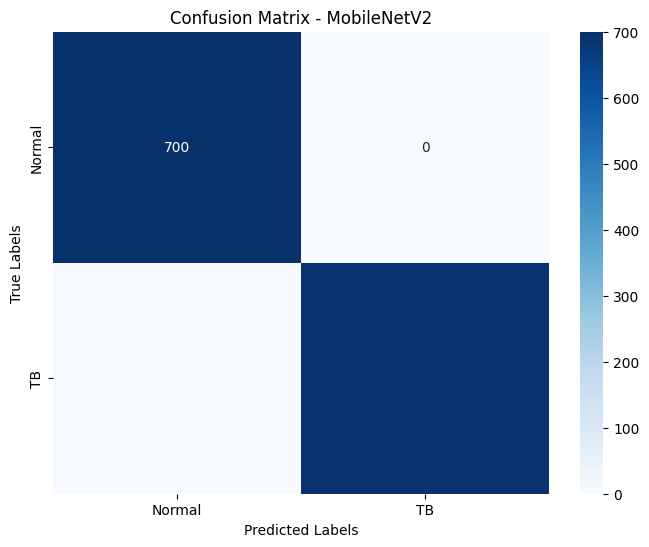

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['Normal', 'TB'], yticklabels=['Normal', 'TB'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix - MobileNetV2')
plt.show()


44/44 ━━━━━━━━━━━━━━━━━━━━ 29s 652ms/step - accuracy: 0.9984 - loss: 0.0034
Validation Loss: 0.005058733746409416
Validation Accuracy: 0.9978525638580322


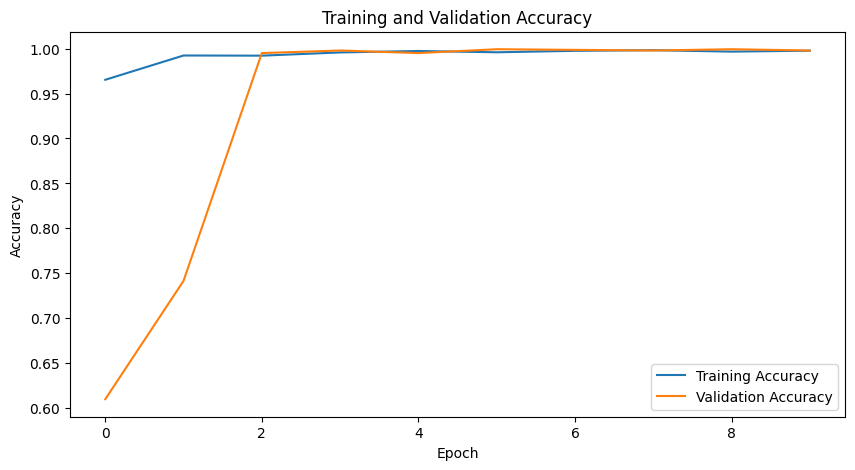

In [17]:
# Evaluate the model
loss, accuracy = model.evaluate(valid_generator)
print("Validation Loss:", loss)
print("Validation Accuracy:", accuracy)

# Visualize training history
epochs = range(len(history.history['accuracy']))

plt.figure(figsize=(10, 5))
plt.plot(epochs, history.history['accuracy'], label='Training Accuracy')
plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

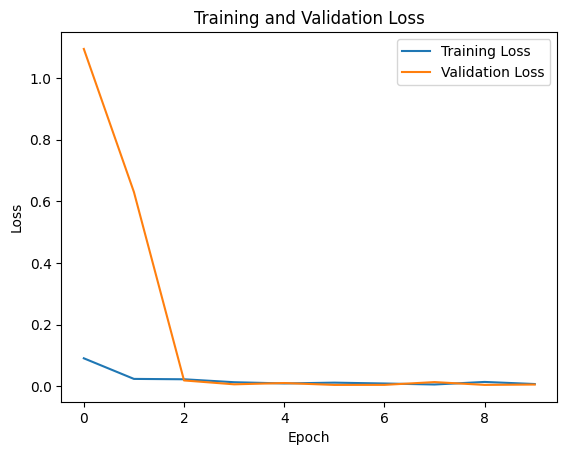

In [18]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

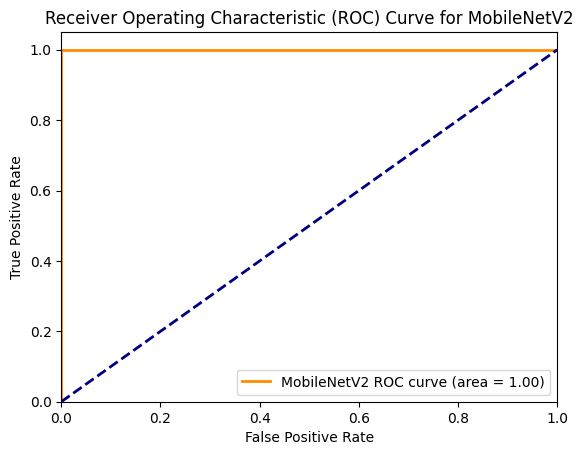

MobileNetV2 AUC-ROC: 1.0


In [19]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for MobileNetV2
fpr_mobilenet, tpr_mobilenet, _ = roc_curve(y_true, y_pred_prob[:, 1])  # Assuming tuberculosis is class 1
roc_auc_mobilenet = auc(fpr_mobilenet, tpr_mobilenet)

# Plot ROC curve for MobileNetV2
plt.figure()
plt.plot(fpr_mobilenet, tpr_mobilenet, color='darkorange', lw=2, label='MobileNetV2 ROC curve (area = %0.2f)' % roc_auc_mobilenet)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for MobileNetV2')
plt.legend(loc="lower right")
plt.show()

print("MobileNetV2 AUC-ROC:", roc_auc_mobilenet)
